# Étude des prix immobiliers dans le département de la Côte d'Or

Ce notebook présente les prix de l'immobilier en Côte d'Or à partir de 2014, première année disponible pour les valeurs foncières et immobilières.

Les données sont issues de la base DVF+ (demandes de valeurs foncières) disponible en open data depuis mai 2019 sur le site du cerema https://datafoncier.cerema.fr/donnees/autres-donnees-foncieres/dvfplus-open-data

Il s'agit des fichiers tableurs (.csv) reprenant les informations de la table mutation : dans ce format, chaque ligne correspond aux informations d'une vente.

Après un nettoyage des données, un traitement statistique a été réalisé pour étudier les prix du foncier et de l'immobilier dans le département. Des sorties graphiques et cartographiques viennent compléter l'étude.

### Table des matières

* [1. Import des librairies et chargement des données](#chapter1)


* [2. Nettoyage des données](#chapter2)
    
    
* [3. Suppression des valeurs aberrantes](#chapter3)
    * [a. Terrains à bâtir](#section_3_1)
    * [b. Maisons et appartements](#section_3_2)
    
    
* [4. Ajout des caractéristiques géographiques](#chapter4)


* [5. Génération des graphiques et cartographies](#chapter5)
    * [a. Terrains à bâtir](#section_5_1)
    * [b. Maisons et appartements](#section_5_2)

## 1. Import des librairies et chargement des données <a class="anchor" id="chapter1"></a>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
from scipy import stats
import geopandas as gpd
import folium
import mapclassify

pd.options.mode.chained_assignment = None

#aperçu général
dvf = pd.read_csv('mutations_d21.csv',sep=";")
dvf.head()

,idmutation,idmutinvar,idopendata,idnatmut,codservch,refdoc,datemut,anneemut,moismut,coddep,...,sapt3pp,sapt4pp,sapt5pp,smai1pp,smai2pp,smai3pp,smai4pp,smai5pp,codtypbien,libtypbien
0,2097403,efa2199df151df933d072be330d39493,efa2199df151df933d072be330d39493,6,NaN,NaN,2017-03-17,2017,3,21,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14,ACTIVITE
1,2166882,06b73e3d7502952e27cc6d7e1ff440e1,06b73e3d7502952e27cc6d7e1ff440e1,4,NaN,NaN,2015-01-16,2015,1,21,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,21,TERRAIN DE TYPE TAB
2,2199482,7584d431b29c3076d8fa7dcccce33b1a,7584d431b29c3076d8fa7dcccce33b1a,2,NaN,NaN,2014-11-27,2014,11,21,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,121,UN APPARTEMENT
3,2204700,8021fcf64463601915ec50107b1b6229,8021fcf64463601915ec50107b1b6229,1,NaN,NaN,2014-05-14,2014,5,21,...,67.0,146.0,0.0,0.0,0.0,0.0,0.0,0.0,120,APPARTEMENT INDETERMINE
4,2164431,9e9b75c9b6913687de4b7c3871eb39cb,9e9b75c9b6913687de4b7c3871eb39cb,1,NaN,NaN,2015-10-13,2015,10,21,...,77.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,121,UN APPARTEMENT


- Informations générales du fichier

In [2]:
dvf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103969 entries, 0 to 103968
Data columns (total 58 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   idmutation  103969 non-null  int64  
 1   idmutinvar  103969 non-null  object 
 2   idopendata  103969 non-null  object 
 3   idnatmut    103969 non-null  int64  
 4   codservch   0 non-null       float64
 5   refdoc      0 non-null       float64
 6   datemut     103969 non-null  object 
 7   anneemut    103969 non-null  int64  
 8   moismut     103969 non-null  int64  
 9   coddep      103969 non-null  int64  
 10  libnatmut   103969 non-null  object 
 11  vefa        103969 non-null  bool   
 12  valeurfonc  103837 non-null  float64
 13  nbdispo     103969 non-null  int64  
 14  nblot       103969 non-null  int64  
 15  nbcomm      103969 non-null  int64  
 16  l_codinsee  103969 non-null  object 
 17  nbsection   103969 non-null  int64  
 18  l_section   103969 non-null  object 
 19  nb

## 2. Nettoyage des données <a class="anchor" id="chapter2"></a>

- Suppression des colonnes non utiles à l'étude

In [3]:
dvf = dvf.drop(columns=['idmutinvar','idopendata','codservch','refdoc','moismut','coddep','nbdispo',
                        'nblot','nbsuf','nblocact','sbatact','nbparmut','l_idparmut','nbvolmut','nblocmut','l_idlocmut'])

Application de divers filtres :

Filtre sur les transactions concernant uniquement :
- une maison, un appartement ou un terrain à bâtir, 
- une vente, une vente en l'état futur d'achèvement ou une Vente terrain à bâtir
- ayant eu lieu sur une seule commune et une seule section cadastrale
- dont la valeur foncière est renseignée

In [4]:
dvf = dvf.loc[(dvf['nbcomm'] == 1) & (dvf['nbsection'] == 1) & (dvf['valeurfonc'].notnull()) &
        ((dvf['idnatmut'] == 1 )| (dvf['idnatmut'] == 2) | (dvf['idnatmut'] == 4)) &
        ((dvf['codtypbien'] == 21 ) | (dvf['codtypbien'] == 111) | (dvf['codtypbien'] == 121)),:]

- Création de deux colonnes "nbp" (nombre de pièces) et "surf" (surface)

In [5]:
def nbp(dvf):
    
    if (dvf['nbapt1pp'] ==1) or (dvf['nbmai1pp'] ==1):
        return 1
    elif (dvf['nbapt2pp'] ==1) or (dvf['nbmai2pp'] ==1):
        return 2
    elif (dvf['nbapt3pp'] ==1) or (dvf['nbmai3pp'] ==1):
        return 3
    elif (dvf['nbapt4pp'] ==1) or (dvf['nbmai4pp'] ==1):
        return 4
    elif (dvf['nbapt5pp'] ==1) or (dvf['nbmai5pp'] ==1):
        return 5
    else:
        return 0
    
dvf['nbp'] = dvf.apply(nbp, axis = 1)
dvf['surf']=dvf['sbatmai']+dvf['sbatapt']

- Suppression de nouvelles colonnes

In [6]:
dvf = dvf.drop(columns=['nbcomm','nbsection','nbapt1pp','nbapt2pp','nbapt3pp','nbapt4pp','nbapt5pp',
                        'nbmai1pp','nbmai2pp','nbmai3pp','nbmai4pp','nbmai5pp',
                        'sbati','sbatmai','sbatapt',
                        'sapt1pp','sapt2pp','sapt3pp','sapt4pp','sapt5pp',
                        'smai1pp','smai2pp','smai3pp','smai4pp','smai5pp'])

- Nettoyage des colonnes 'l_codinsee' et 'l_section'

In [7]:
dvf['l_codinsee'] = dvf['l_codinsee'].str.slice(start=2, stop=7)
dvf['l_section'] = dvf['l_section'].str.slice(start=2, stop=4)

In [8]:
dvf

,idmutation,idnatmut,datemut,anneemut,libnatmut,vefa,valeurfonc,l_codinsee,l_section,nbpar,l_idpar,sterr,nblocmai,nblocapt,nblocdep,codtypbien,libtypbien,nbp,surf
1,2166882,4,2015-01-16,2015,Vente terrain à bâtir,False,379500.0,21565,AB,2,"['21565000AB0095', '21565000AB0239']",16500.0,0,0,0,21,TERRAIN DE TYPE TAB,0,0.0
2,2199482,2,2014-11-27,2014,Vente en l'état futur d'achèvement,True,82455.0,21166,AK,1,['21166000AK0569'],0.0,0,1,1,121,UN APPARTEMENT,2,39.0
4,2164431,1,2015-10-13,2015,Vente,False,160000.0,21231,CP,1,['21231000CP0318'],0.0,0,1,1,121,UN APPARTEMENT,3,77.0
7,2160910,2,2015-10-21,2015,Vente en l'état futur d'achèvement,True,100700.0,21355,BP,1,['21355000BP0222'],0.0,0,1,1,121,UN APPARTEMENT,2,40.0
10,2027756,1,2018-03-29,2018,Vente,False,155850.0,21515,AD,1,['21515000AD0008'],0.0,0,1,1,121,UN APPARTEMENT,3,59.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103962,1858593,1,2021-02-23,2021,Vente,False,30100.0,21054,ED,1,['21054000ED0186'],346.0,1,0,0,111,UNE MAISON,4,72.0
103963,1869532,1,2021-02-10,2021,Vente,False,155000.0,21231,BO,1,['21231000BO0006'],0.0,0,1,1,121,UN APPARTEMENT,2,71.0
103965,2032926,1,2018-02-16,2018,Vente,False,125000.0,21171,AR,1,['21171000AR0132'],0.0,0,1,0,121,UN APPARTEMENT,4,78.0
103967,1859544,1,2021-07-12,2021,Vente,False,332500.0,21231,CZ,1,['21231000CZ0010'],674.0,1,0,0,111,UNE MAISON,3,86.0


## 3. Suppression des valeurs aberrantes <a class="anchor" id="chapter3"></a>

### a. Terrains à bâtir <a class="anchor" id="section_3_1"></a>

- Sélection des terrains à bâtir uniquement

In [9]:
dvf_tab = dvf[dvf['codtypbien'] == 21]

- Suppression des 5 % valeurs extrêmes

In [10]:
seuil_min = np.percentile(dvf_tab['valeurfonc'], 2.5)
seuil_max = np.percentile(dvf_tab['valeurfonc'], 97.5)
dvf_tab2 = dvf_tab.loc[(dvf_tab['valeurfonc'] > seuil_min) & (dvf_tab['valeurfonc'] <seuil_max),:]

In [11]:
dvf_tab_final = dvf_tab2.sort_values('valeurfonc')
dvf_tab_final.head()

,idmutation,idnatmut,datemut,anneemut,libnatmut,vefa,valeurfonc,l_codinsee,l_section,nbpar,l_idpar,sterr,nblocmai,nblocapt,nblocdep,codtypbien,libtypbien,nbp,surf
102054,2128062,1,2016-06-23,2016,Vente,False,2030.0,21568,ZD,1,['21568000ZD0041'],1015.0,0,0,0,21,TERRAIN DE TYPE TAB,0,0.0
24106,2168769,1,2015-05-27,2015,Vente,False,2100.0,21132,0C,2,"['211320000C0646', '211320000C0658']",732.0,0,0,0,21,TERRAIN DE TYPE TAB,0,0.0
21227,1932269,1,2020-10-29,2020,Vente,False,2101.0,21579,ZD,4,"['21579000ZD0087', '21579000ZD0099', '21579000...",2101.0,0,0,0,21,TERRAIN DE TYPE TAB,0,0.0
60926,2127543,4,2016-01-08,2016,Vente terrain à bâtir,False,2102.4,21603,AP,1,['21603000AP0122'],146.0,0,0,0,21,TERRAIN DE TYPE TAB,0,0.0
84090,1863341,4,2021-02-09,2021,Vente terrain à bâtir,False,2160.0,21634,AB,1,['21634000AB0159'],540.0,0,0,0,21,TERRAIN DE TYPE TAB,0,0.0


### b. Maisons et appartements <a class="anchor" id="section_3_2"></a>

- Sélection des maisons et appartements

In [12]:
dvf_ma = dvf[dvf['codtypbien'] != 21]

- Informations sur les valeurs extrêmes (prix/surface)

In [13]:
dvf_ma['valeurfonc'].describe()

count    6.260600e+04
mean     1.553535e+05
std      1.061925e+05
min      0.000000e+00
25%      8.500000e+04
50%      1.350000e+05
75%      1.970000e+05
max      4.267620e+06
Name: valeurfonc, dtype: float64

In [14]:
dvf_ma['surf'].describe()

count    62606.000000
mean        81.138677
std         42.273866
min          9.000000
25%         53.000000
50%         75.000000
75%        100.000000
max        680.000000
Name: surf, dtype: float64

- Représentations graphiques des distributions

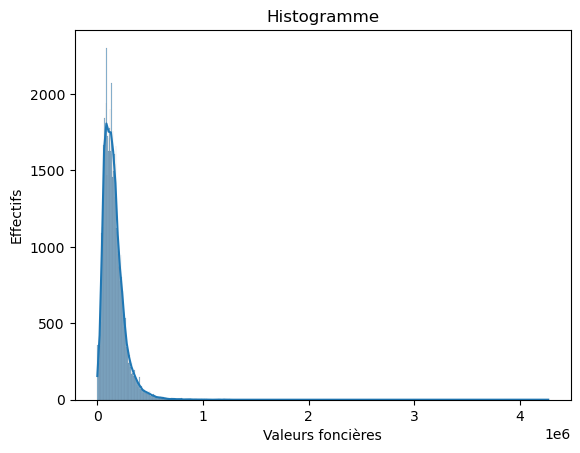

In [15]:
sns.histplot(data=dvf_ma, x='valeurfonc', kde = True)
plt.ylabel("Effectifs")
plt.xlabel("Valeurs foncières")
plt.title("Histogramme")
plt.show()

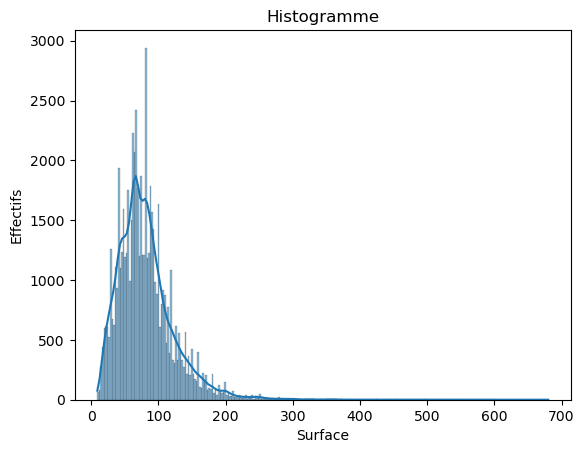

In [16]:
sns.histplot(data=dvf_ma, x='surf', kde = True)
plt.ylabel("Effectifs")
plt.xlabel("Surface")
plt.title("Histogramme")
plt.show()

A la vue des histogrammes, nous gardons les ventes dont le prix minimum est au dessus du 1er percentile pour supprimer les ventes aux très faibles montants et les ventes supérieures à un million d'euro ainsi que les biens avec une surface supérieure à 350 m²

In [17]:
seuil_min2 = np.percentile(dvf_ma['valeurfonc'], 1)
dvf_ma2 = dvf_ma.loc[(dvf_ma['valeurfonc'] > seuil_min2) & (dvf_ma['valeurfonc'] < 1000000) & (dvf_ma['surf'] < 350) ,:]

In [18]:
dvf_ma2.sort_values('valeurfonc').head()

,idmutation,idnatmut,datemut,anneemut,libnatmut,vefa,valeurfonc,l_codinsee,l_section,nbpar,l_idpar,sterr,nblocmai,nblocapt,nblocdep,codtypbien,libtypbien,nbp,surf
51494,2071169,1,2017-11-30,2017,Vente,False,12100.0,21584,AL,1,['21584000AL0810'],249.0,1,0,0,111,UNE MAISON,2,112.0
41041,1869940,1,2021-11-09,2021,Vente,False,12200.0,21231,EL,1,['21231000EL0553'],0.0,0,1,1,121,UN APPARTEMENT,1,30.0
58661,2207559,1,2014-11-05,2014,Vente,False,12500.0,21643,0B,1,['216430000B0940'],466.0,1,0,0,111,UNE MAISON,4,74.0
67209,2201216,1,2014-07-23,2014,Vente,False,12500.0,21231,IB,1,['21231000IB0047'],0.0,0,1,1,121,UN APPARTEMENT,3,66.0
77031,2165784,1,2015-06-04,2015,Vente,False,12500.0,21693,WE,1,['21693000WE0171'],1457.0,1,0,0,111,UNE MAISON,3,28.0


- Création de la colonne prix au m²

In [19]:
dvf_ma2['prix_m2'] = dvf_ma2['valeurfonc']/dvf_ma2['surf']

In [20]:
dvf_ma2['prix_m2'].describe()

count    61862.000000
mean      2036.370921
std        913.216846
min         85.526316
25%       1437.500000
50%       1983.890929
75%       2549.019608
max      44444.444444
Name: prix_m2, dtype: float64

- Récupération de la limite supérieure de la deuxième classe

[6.1328e+04 5.2300e+02 7.0000e+00 2.0000e+00 1.0000e+00 0.0000e+00
 0.0000e+00 0.0000e+00 0.0000e+00 1.0000e+00]
[   85.52631579  4521.41812865  8957.30994152 13393.20175439
 17829.09356725 22264.98538012 26700.87719298 31136.76900585
 35572.66081871 40008.55263158 44444.44444444]
<BarContainer object of 10 artists>


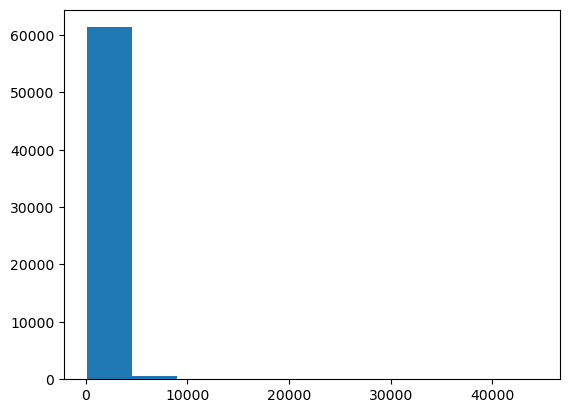

In [21]:
n, bins, patches = plt.hist(dvf_ma2['prix_m2'])

print(n)
print(bins)
print(patches)

In [22]:
limite = bins[2]

- Filtre du dataframe sur les prix de ventes inférieurs à la limite de la deuxième classe

In [23]:
dvf_ma_final = dvf_ma2.loc[(dvf_ma2['prix_m2'] < limite),:]

In [24]:
dvf_ma_final.sort_values('prix_m2')

,idmutation,idnatmut,datemut,anneemut,libnatmut,vefa,valeurfonc,l_codinsee,l_section,nbpar,l_idpar,sterr,nblocmai,nblocapt,nblocdep,codtypbien,libtypbien,nbp,surf,prix_m2
22762,2074357,1,2017-11-22,2017,Vente,False,13000.0,21584,AL,1,['21584000AL0094'],255.0,1,0,0,111,UNE MAISON,5,152.0,85.526316
75499,2164483,1,2015-03-26,2015,Vente,False,13000.0,21404,AD,2,"['21404000AD0316', '21404000AD0318']",480.0,1,0,0,111,UNE MAISON,4,138.0,94.202899
98306,2128097,1,2016-12-02,2016,Vente,False,15000.0,21231,BP,1,['21231000BP0197'],0.0,0,1,0,121,UN APPARTEMENT,5,153.0,98.039216
87415,1858276,1,2021-06-17,2021,Vente,False,20000.0,21040,0B,1,['210400000B0207'],290.0,1,0,0,111,UNE MAISON,3,200.0,100.000000
15882,1973359,1,2019-07-31,2019,Vente,False,15000.0,21476,AA,2,"['21476000AA0129', '21476000AA0130']",235.0,1,0,0,111,UNE MAISON,5,145.0,103.448276
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9725,1977555,1,2019-04-16,2019,Vente,False,248500.0,21231,EW,1,['21231000EW0206'],0.0,0,1,0,121,UN APPARTEMENT,1,30.0,8283.333333
67660,2199625,1,2014-01-17,2014,Vente,False,125000.0,21231,BE,1,['21231000BE0022'],0.0,0,1,1,121,UN APPARTEMENT,2,15.0,8333.333333
5666,2072681,1,2017-09-14,2017,Vente,False,160000.0,21647,0C,1,['216470000C0180'],1755.0,1,0,0,111,UNE MAISON,1,19.0,8421.052632
76159,1925031,1,2020-07-28,2020,Vente,False,457000.0,21231,EW,1,['21231000EW0206'],0.0,0,1,1,121,UN APPARTEMENT,2,54.0,8462.962963


## 4. Ajout des caractéristiques géographiques <a class="anchor" id="chapter4"></a>

- Import des données géographiques

In [25]:
referentiel_geographique = pd.read_excel('ref_final.xlsx')
referentiel_geographique.head()

,CODGEO,LIBGEO,latitude,longitude,DEP,LIBDEP,REG,LIBREG,EPCI,IM,ZE2020,UU2020,AAV2020,BV2012
0,01001,L'Abergement-Clémenciat,46.153426,4.926114,01,Ain,84,Auvergne-Rhône-Alpes,200069193,CC de la Dombes,Bourg en Bresse,Communes hors unité urbaine du département 01,Châtillon-sur-Chalaronne,Châtillon-sur-Chalaronne
1,01002,L'Abergement-de-Varey,46.009188,5.428017,01,Ain,84,Auvergne-Rhône-Alpes,240100883,CC de la Plaine de l'Ain,Bourg en Bresse,Communes hors unité urbaine du département 01,Commune hors attraction des villes,Ambérieu-en-Bugey
2,01004,Ambérieu-en-Bugey,45.960848,5.372926,01,Ain,84,Auvergne-Rhône-Alpes,240100883,CC de la Plaine de l'Ain,Bourg en Bresse,Ambérieu-en-Bugey,Ambérieu-en-Bugey,Ambérieu-en-Bugey
3,01005,Ambérieux-en-Dombes,45.996180,4.912273,01,Ain,84,Auvergne-Rhône-Alpes,200042497,CC Dombes Saône Vallée,Villefranche-sur-Saône,Communes hors unité urbaine du département 01,Lyon,Lyon
4,01006,Ambléon,45.749499,5.594320,01,Ain,84,Auvergne-Rhône-Alpes,200040350,CC Bugey Sud,Belley,Communes hors unité urbaine du département 01,Belley,Belley


- Jointure entre les tables terrains à bâtir et référentiel géographique

In [26]:
tab_geo = pd.merge(dvf_tab_final,referentiel_geographique, left_on='l_codinsee', right_on='CODGEO', how='left')
tab_geo.head()

,idmutation,idnatmut,datemut,anneemut,libnatmut,vefa,valeurfonc,l_codinsee,l_section,nbpar,...,DEP,LIBDEP,REG,LIBREG,EPCI,IM,ZE2020,UU2020,AAV2020,BV2012
0,2128062,1,2016-06-23,2016,Vente,False,2030.0,21568,ZD,1,...,21,Côte-d'or,27.0,Bourgogne-Franche-Comté,242101491,CC du Montbardois,Châtillon-Montbard,Communes hors unité urbaine du département 21,Montbard,Montbard
1,2168769,1,2015-05-27,2015,Vente,False,2100.0,21132,0C,2,...,21,Côte-d'or,27.0,Bourgogne-Franche-Comté,200070894,CC de Gevrey-Chambertin et de Nuits-Saint-Georges,Dijon,Communes hors unité urbaine du département 21,Dijon,Dijon
2,1932269,1,2020-10-29,2020,Vente,False,2101.0,21579,ZD,4,...,21,Côte-d'or,27.0,Bourgogne-Franche-Comté,200070910,CC Tille et Venelle,Dijon,Communes hors unité urbaine du département 21,Dijon,Is-sur-Tille
3,2127543,4,2016-01-08,2016,Vente terrain à bâtir,False,2102.4,21603,AP,1,...,21,Côte-d'or,27.0,Bourgogne-Franche-Comté,200071017,CC des Terres d'Auxois,Châtillon-Montbard,Semur-en-Auxois,Semur-en-Auxois,Semur-en-Auxois
4,1863341,4,2021-02-09,2021,Vente terrain à bâtir,False,2160.0,21634,AB,1,...,21,Côte-d'or,27.0,Bourgogne-Franche-Comté,200071207,CC de Pouilly-en-Auxois/Bligny-sur-Ouche,Beaune,Communes hors unité urbaine du département 21,Dijon,Pouilly-en-Auxois


- Jointure entre les tables maisons appartements et référentiel géographique

In [27]:
ventes_immo_geo = pd.merge(dvf_ma_final,referentiel_geographique, left_on='l_codinsee', right_on='CODGEO', how='left')
ventes_immo_geo

,idmutation,idnatmut,datemut,anneemut,libnatmut,vefa,valeurfonc,l_codinsee,l_section,nbpar,...,DEP,LIBDEP,REG,LIBREG,EPCI,IM,ZE2020,UU2020,AAV2020,BV2012
0,2199482,2,2014-11-27,2014,Vente en l'état futur d'achèvement,True,82455.0,21166,AK,1,...,21,Côte-d'or,27.0,Bourgogne-Franche-Comté,242100410,Dijon Métropole,Dijon,Dijon,Dijon,Dijon
1,2164431,1,2015-10-13,2015,Vente,False,160000.0,21231,CP,1,...,21,Côte-d'or,27.0,Bourgogne-Franche-Comté,242100410,Dijon Métropole,Dijon,Dijon,Dijon,Dijon
2,2160910,2,2015-10-21,2015,Vente en l'état futur d'achèvement,True,100700.0,21355,BP,1,...,21,Côte-d'or,27.0,Bourgogne-Franche-Comté,242100410,Dijon Métropole,Dijon,Dijon,Dijon,Dijon
3,2027756,1,2018-03-29,2018,Vente,False,155850.0,21515,AD,1,...,21,Côte-d'or,27.0,Bourgogne-Franche-Comté,242100410,Dijon Métropole,Dijon,Dijon,Dijon,Dijon
4,1928445,1,2020-02-28,2020,Vente,False,66000.0,21231,DM,1,...,21,Côte-d'or,27.0,Bourgogne-Franche-Comté,242100410,Dijon Métropole,Dijon,Dijon,Dijon,Dijon
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61846,1858593,1,2021-02-23,2021,Vente,False,30100.0,21054,ED,1,...,21,Côte-d'or,27.0,Bourgogne-Franche-Comté,200006682,"CA Beaune, Côte et Sud - Communauté Beaune-Cha...",Beaune,Beaune,Beaune,Beaune
61847,1869532,1,2021-02-10,2021,Vente,False,155000.0,21231,BO,1,...,21,Côte-d'or,27.0,Bourgogne-Franche-Comté,242100410,Dijon Métropole,Dijon,Dijon,Dijon,Dijon
61848,2032926,1,2018-02-16,2018,Vente,False,125000.0,21171,AR,1,...,21,Côte-d'or,27.0,Bourgogne-Franche-Comté,242100410,Dijon Métropole,Dijon,Dijon,Dijon,Dijon
61849,1859544,1,2021-07-12,2021,Vente,False,332500.0,21231,CZ,1,...,21,Côte-d'or,27.0,Bourgogne-Franche-Comté,242100410,Dijon Métropole,Dijon,Dijon,Dijon,Dijon


## 5. Génération des graphiques et cartographies <a class="anchor" id="chapter5"></a>

### a. Terrains à bâtir <a class="anchor" id="section_5_1"></a>

- Évolution du nombre de ventes de terrains à bâtir

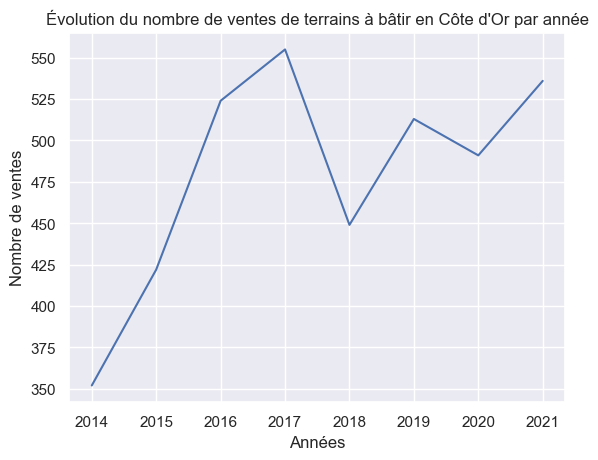

In [28]:
# Créer un nouveau dataframe avec le nombre de lignes par année
tab_geo_count = tab_geo.groupby(tab_geo['anneemut']).size().reset_index(name='count')

# Import du thème
sns.set_theme(style="darkgrid")

# Créer le barplot avec seaborn
sns.lineplot(x='anneemut', y='count', data=tab_geo_count)

# Titres des axes et du graphique
plt.ylabel("Nombre de ventes")
plt.xlabel("Années")
plt.title("Évolution du nombre de ventes de terrains à bâtir en Côte d'Or par année")
  
# Afficher le graphique
plt.show()

- Évolution du prix médian des terrains à bâtir

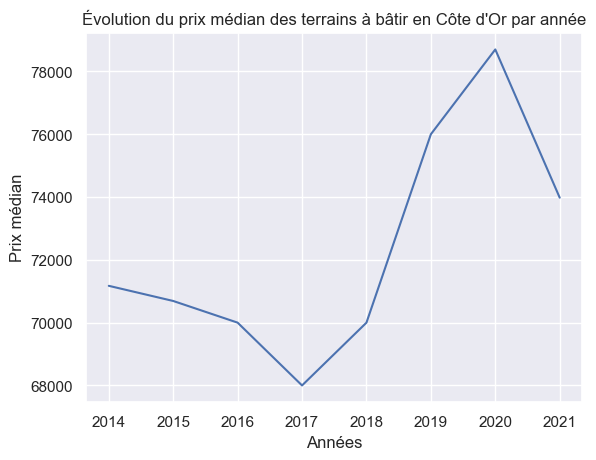

In [29]:
# Créer un nouveau dataframe avec le prix médian par année
tab_geo_median = tab_geo.groupby(tab_geo['anneemut'])['valeurfonc'].median().reset_index(name='prix_median')

# Import du thème
sns.set_theme(style="darkgrid")

# Créer le barplot avec seaborn
sns.lineplot(x='anneemut', y='prix_median', data=tab_geo_median)

# Titres des axes et du graphique
plt.ylabel("Prix médian")
plt.xlabel("Années")
plt.title("Évolution du prix médian des terrains à bâtir en Côte d'Or par année")

# Afficher le graphique
plt.show()

- Évolution du prix médian au m² des terrains à bâtir

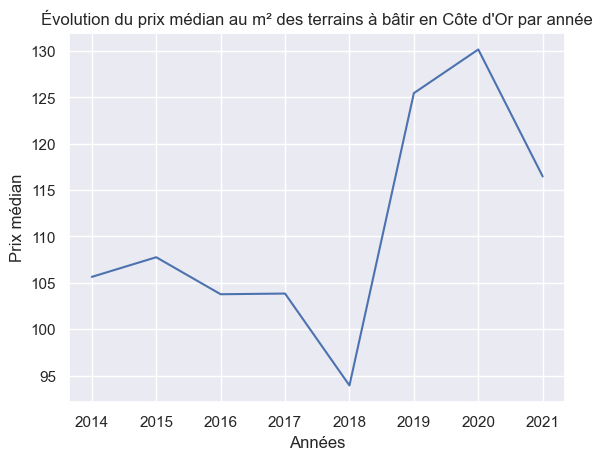

In [30]:
# Créer une colonne prix m²
tab_geo['prix_m2'] = tab_geo['valeurfonc'] / tab_geo['sterr']

# Import du thème
sns.set_theme(style="darkgrid")

# Créer un nouveau dataframe avec le prix médian par année
tab_geo_m2_median = tab_geo.groupby(tab_geo['anneemut'])['prix_m2'].median().reset_index(name='prix_median')

# Créer le barplot avec seaborn
sns.lineplot(x='anneemut', y='prix_median', data=tab_geo_m2_median)

# Titres des axes et du graphique
plt.ylabel("Prix médian")
plt.xlabel("Années")
plt.title("Évolution du prix médian au m² des terrains à bâtir en Côte d'Or par année")

# Afficher le graphique
plt.show()

- Comparaison du prix médian des terrains à bâtir entre les différents EPCI de Côte d'Or

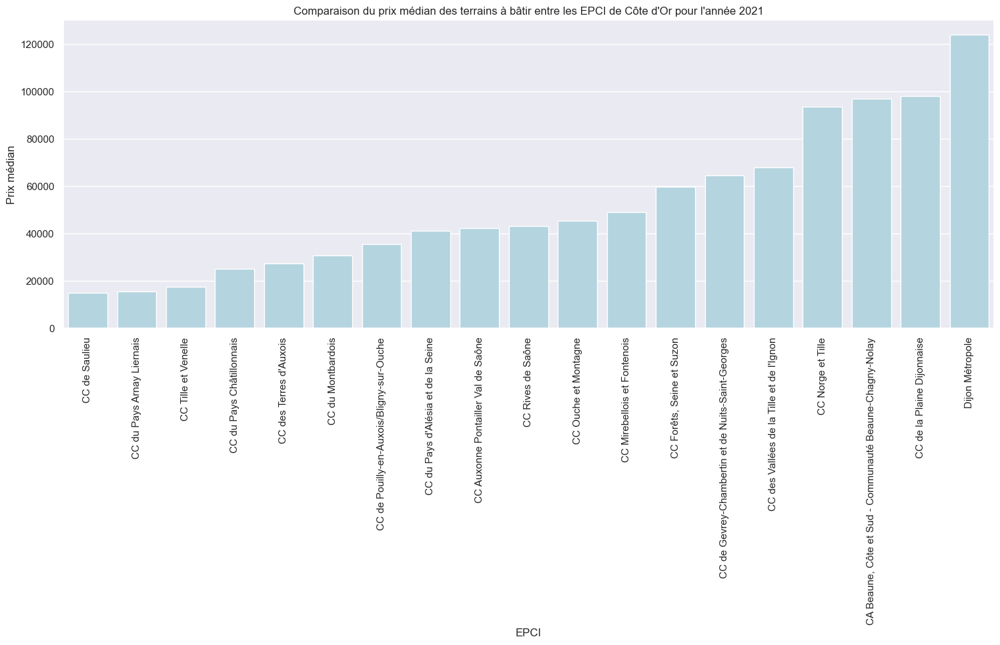

In [31]:
# Sélectionner les lignes de la derniere annee
derniere_annee = tab_geo['anneemut'].max()
tab_geo_derniere_annee = tab_geo[tab_geo['anneemut'] == derniere_annee]

tab_geo_median_EPCI = tab_geo_derniere_annee.groupby(tab_geo_derniere_annee['IM'])['valeurfonc'].median().reset_index(name='prix_median')

# Trier les barres par prix croissant
tab_geo_median_EPCI = tab_geo_median_EPCI.sort_values(by='prix_median', ascending=True)

# Augmenter la taille du graphique
plt.figure(figsize=(18, 6))

# Créer le barplot avec seaborn
sns.barplot(x='IM', y='prix_median', data=tab_geo_median_EPCI, color = 'lightblue')

# Afficher les étiquettes de l'axe x (villes)
plt.xticks(rotation=90)

# Titres des axes et du graphique
plt.ylabel("Prix médian")
plt.xlabel("EPCI")
plt.title(f"Comparaison du prix médian des terrains à bâtir entre les EPCI de Côte d'Or pour l'année {derniere_annee}")

# Afficher le graphique
plt.show()

- Comparaison du prix médian au m² des terrains à bâtir entre les différents EPCI de Côte d'Or

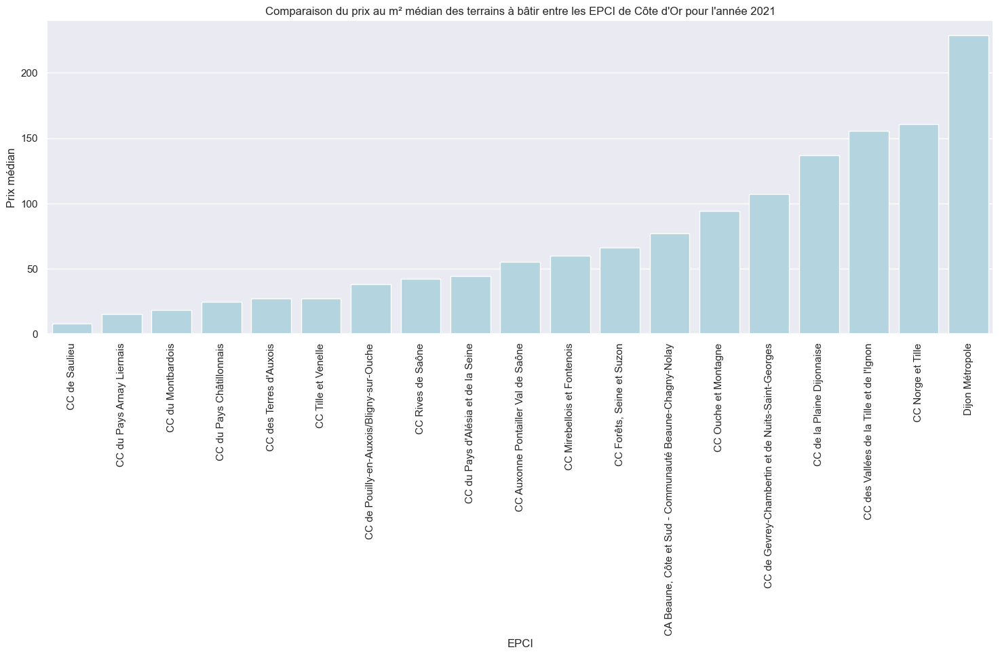

In [32]:
tab_geo_m2_median_EPCI = tab_geo_derniere_annee.groupby(tab_geo_derniere_annee['IM'])['prix_m2'].median().reset_index(name='prix_median')

# Trier les barres par prix croissant
tab_geo_m2_median_EPCI = tab_geo_m2_median_EPCI.sort_values(by='prix_median', ascending=True)

# Augmenter la taille du graphique
plt.figure(figsize=(18, 6))

# Créer le barplot avec seaborn
sns.barplot(x='IM', y='prix_median', data=tab_geo_m2_median_EPCI, color = 'lightblue')

# Afficher les étiquettes de l'axe x (villes)
plt.xticks(rotation=90)

# Titres des axes et du graphique
plt.ylabel("Prix médian")
plt.xlabel("EPCI")
plt.title(f"Comparaison du prix au m² médian des terrains à bâtir entre les EPCI de Côte d'Or pour l'année {derniere_annee}")

# Afficher le graphique
plt.show()

**Graphiques d'évolution des prix selon l'EPCI choisi**

- Liste des EPCI

In [33]:
EPCI = tab_geo['IM'].unique()

print("Voici les EPCI disponibles :")
for i, EPCI in enumerate(EPCI):
  print(f"{i+1}. {EPCI}")

Voici les EPCI disponibles :
1. CC du Montbardois
2. CC de Gevrey-Chambertin et de Nuits-Saint-Georges
3. CC Tille et Venelle
4. CC des Terres d'Auxois
5. CC de Pouilly-en-Auxois/Bligny-sur-Ouche
6. CC du Pays Châtillonnais
7. CC des Vallées de la Tille et de l'Ignon
8. CA Beaune, Côte et Sud - Communauté Beaune-Chagny-Nolay
9. CC du Pays d'Alésia et de la Seine
10. CC Mirebellois et Fontenois
11. Dijon Métropole
12. CC Forêts, Seine et Suzon
13. CC Norge et Tille
14. CC de Saulieu
15. CC Ouche et Montagne
16. nan
17. CC Rives de Saône
18. CC Auxonne Pontailler Val de Saône
19. CC de la Plaine Dijonnaise
20. CC du Pays Arnay Liernais


- Choix de l'EPCI par l'utilisateur

In [34]:
choix_EPCI = input("Veuillez saisir le nom de l'EPCI' souhaité : ")

Veuillez saisir le nom de l'EPCI' souhaité : CC de la Plaine Dijonnaise


In [35]:
df_EPCI = tab_geo[tab_geo['IM'] == choix_EPCI]

- Evolution du prix médian des terrains à bâtir

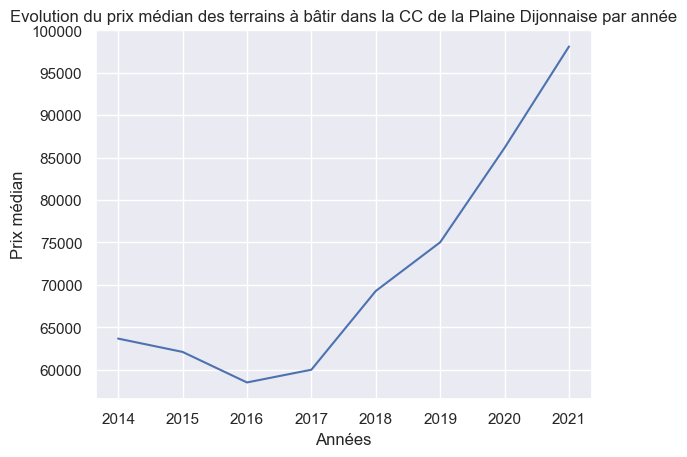

In [36]:
# Créer un nouveau dataframe avec le prix médian par année
prix_median = df_EPCI.groupby('anneemut')['valeurfonc'].median()

# Créer le barplot avec seaborn
sns.lineplot(x=prix_median.index, y=prix_median)

# Titres des axes et du graphique
plt.ylabel("Prix médian")
plt.xlabel("Années")
plt.title(f"Evolution du prix médian des terrains à bâtir dans la {choix_EPCI} par année")

# Afficher le graphique
plt.show()

- Evolution du prix au m² médian des terrains à bâtir

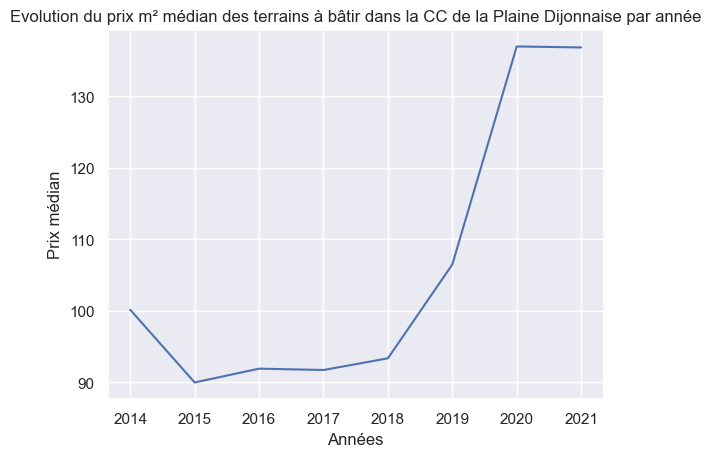

In [37]:
# Créer un nouveau dataframe avec le prix médian au m² par année
prix_median_m2 = df_EPCI.groupby('anneemut')['prix_m2'].median()

# Créer le barplot avec seaborn
sns.lineplot(x=prix_median_m2.index, y=prix_median_m2)

# Titres des axes et du graphique
plt.ylabel("Prix médian")
plt.xlabel("Années")
plt.title(f"Evolution du prix m² médian des terrains à bâtir dans la {choix_EPCI} par année")

# Afficher le graphique
plt.show()

**Cartographies**

- Import des fonds de carte

In [38]:
# Chargez les données géographiques des epci et communes en utilisant Geopandas
epci = gpd.read_file('epci.shp')
communes = gpd.read_file('21.shp')

- Jointures pour intégrer les dimensions géographiques

In [39]:
# Créer un dataframe du prix médian par EPCI pour la dernière année
tab_geo_m2_median_EPCI = tab_geo_derniere_annee.groupby(tab_geo_derniere_annee['EPCI'])['prix_m2'].median().reset_index(name='prix_median')

# Jointure entre les dimensions géométriques et le dataframe
tab_geo_m2_median_EPCI_final = pd.merge(epci,tab_geo_m2_median_EPCI, left_on='communes e', right_on='EPCI',how='left')

In [40]:
# Créer un dataframe du prix médian par commune pour la dernière année
tab_geo_m2_median_communes = tab_geo_derniere_annee.groupby(tab_geo_derniere_annee['l_codinsee'])['prix_m2'].median().reset_index(name='prix_median')

# Jointure entre les dimensions géométriques et le dataframe
tab_geo_m2_median_communes_final = pd.merge(communes,tab_geo_m2_median_communes, left_on='insee', right_on='l_codinsee',how='left')

- Carte du prix au m² médian des terrains à bâtir par EPCI

In [41]:
tab_geo_m2_median_EPCI_final["prix_median"]=round(tab_geo_m2_median_EPCI_final["prix_median"],2)

# Caractéristiques de la carte
m1 = tab_geo_m2_median_EPCI_final.explore(
    column="prix_median",
    tooltip=["prix_median"],
    scheme="FisherJenks",
    legend_kwds=dict(colorbar=False),
    cmap="YlOrRd",
    style_kwds=dict(color="black")
    )

# Options des couches
folium.TileLayer('Stamen Toner', control=True).add_to(m1)
folium.LayerControl().add_to(m1)

# Affichage de la carte
m1

- Carte du prix au m² médian des terrains à bâtir par commune

In [42]:
tab_geo_m2_median_communes_final["prix_median"]=round(tab_geo_m2_median_communes_final["prix_median"],2)

# Caractéristiques de la carte
m2 = tab_geo_m2_median_communes_final.explore(
    column="prix_median",
    tooltip=["nom","prix_median"],
    scheme="FisherJenks",
    legend_kwds=dict(colorbar=False),
    cmap="YlOrRd",
    style_kwds=dict(color="black")
    )

# Options des couches
folium.TileLayer('Stamen Toner', control=True).add_to(m2)
folium.LayerControl().add_to(m2)

# Affichage de la carte
m2

### b. Maisons et appartements <a class="anchor" id="section_5_2"></a>

**Nombre de ventes**

In [43]:
# Création d'un dataframe avec les ventes par année et par type de biens vendus
ventes_immo_an = ventes_immo_geo.pivot_table(index='anneemut',columns='codtypbien',values='idmutation',aggfunc='count')
ventes_immo_an = ventes_immo_an.reset_index()

# Nouveaux noms de colonne
nouveaux_noms = ['Année de mutation','Maison','Appartement']
ventes_immo_an.columns = nouveaux_noms

# Suppression des ventes 2022
ventes_immo_an = ventes_immo_an[ventes_immo_an['Année de mutation'] != 2022]

ventes_immo_an

,Année de mutation,Maison,Appartement
0,2014,2840,2877
1,2015,3284,3373
2,2016,3369,3604
3,2017,3746,4113
4,2018,3870,4195
5,2019,4262,5024
6,2020,4254,4583
7,2021,4152,4300


- Évolution du nombre de ventes de maisons

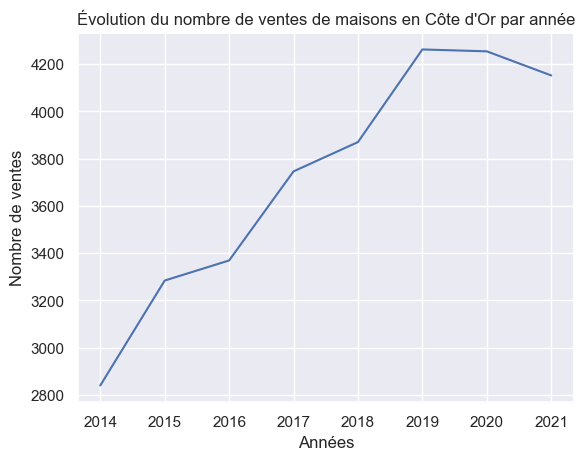

In [44]:
# Import du thème
sns.set_theme(style="darkgrid")

# Créer le barplot avec seaborn
sns.lineplot(x='Année de mutation', y='Maison', data=ventes_immo_an)

# Titres des axes et du graphique
plt.ylabel("Nombre de ventes")
plt.xlabel("Années")
plt.title("Évolution du nombre de ventes de maisons en Côte d'Or par année")
  
# Afficher le graphique
plt.show()

- Évolution du nombre de ventes d'appartements

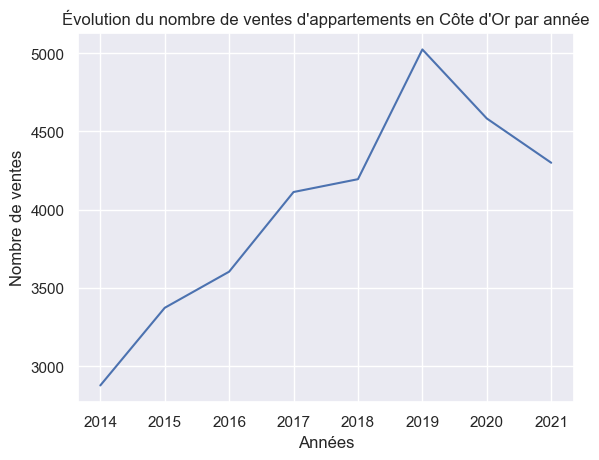

In [45]:
# Import du thème
sns.set_theme(style="darkgrid")

# Créer le barplot avec seaborn
sns.lineplot(x='Année de mutation', y='Appartement', data=ventes_immo_an)

# Titres des axes et du graphique
plt.ylabel("Nombre de ventes")
plt.xlabel("Années")
plt.title("Évolution du nombre de ventes d'appartements en Côte d'Or par année")
  
# Afficher le graphique
plt.show()

**Prix médian des biens**

In [46]:
# Création d'un dataframe avec le prix médian des biens par année et par type de biens vendus
prix_immo_an = ventes_immo_geo.pivot_table(index='anneemut',columns='codtypbien',values='valeurfonc',aggfunc='median')
prix_immo_an = prix_immo_an.reset_index()

# Nouveaux noms de colonne
nouveaux_noms = ['Année de mutation','Maison','Appartement']
prix_immo_an.columns = nouveaux_noms

# Suppression des ventes 2022
prix_immo_an = prix_immo_an[prix_immo_an['Année de mutation'] != 2022]

prix_immo_an

,Année de mutation,Maison,Appartement
0,2014,162822.5,109000.0
1,2015,162000.0,113000.0
2,2016,165000.0,107000.0
3,2017,170000.0,108000.0
4,2018,173850.0,111450.0
5,2019,175000.0,114000.0
6,2020,183000.0,117000.0
7,2021,199000.0,122000.0


- Évolution du prix médian des maisons

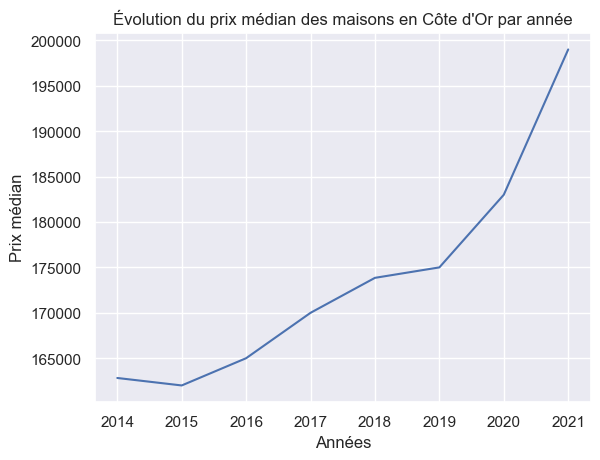

In [47]:
# Import du thème
sns.set_theme(style="darkgrid")

# Créer le barplot avec seaborn
sns.lineplot(x='Année de mutation', y='Maison', data=prix_immo_an)

# Titres des axes et du graphique
plt.ylabel("Prix médian")
plt.xlabel("Années")
plt.title("Évolution du prix médian des maisons en Côte d'Or par année")
  
# Afficher le graphique
plt.show()

- Évolution du prix médian des appartements

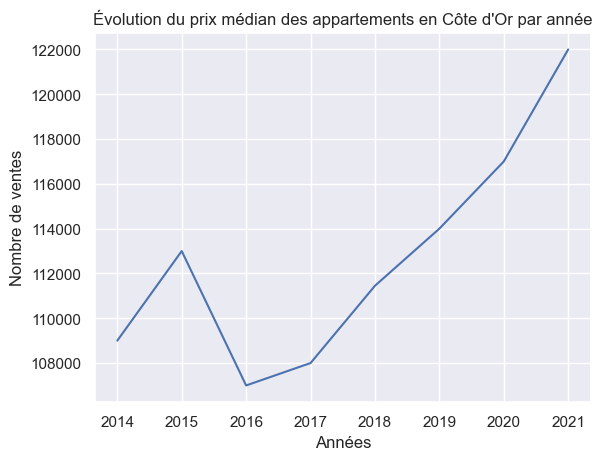

In [48]:
# Import du thème
sns.set_theme(style="darkgrid")

# Créer le barplot avec seaborn
sns.lineplot(x='Année de mutation', y='Appartement', data=prix_immo_an)

# Titres des axes et du graphique
plt.ylabel("Nombre de ventes")
plt.xlabel("Années")
plt.title("Évolution du prix médian des appartements en Côte d'Or par année")
  
# Afficher le graphique
plt.show()

**Prix médian au m² des biens**

In [49]:
# Création d'un dataframe avec le prix médian au m² des biens par année et par type de biens vendus
prix_m2_immo_an = ventes_immo_geo.pivot_table(index='anneemut',columns='codtypbien',values='prix_m2',aggfunc='median')
prix_m2_immo_an = prix_m2_immo_an.reset_index()

# Nouveaux noms de colonne
nouveaux_noms = ['Année de mutation','Maison','Appartement']
prix_m2_immo_an.columns = nouveaux_noms

# Suppression des ventes 2022
prix_m2_immo_an = prix_m2_immo_an[prix_m2_immo_an['Année de mutation'] != 2022]

prix_m2_immo_an

,Année de mutation,Maison,Appartement
0,2014,1719.590054,2035.714286
1,2015,1718.750000,2054.794521
2,2016,1697.716667,2019.230769
3,2017,1756.427159,2054.347826
4,2018,1785.714286,2077.777778
5,2019,1813.859307,2200.000000
6,2020,1865.648321,2279.411765
7,2021,1976.514386,2386.515152


- Évolution du prix médian au m² des maisons

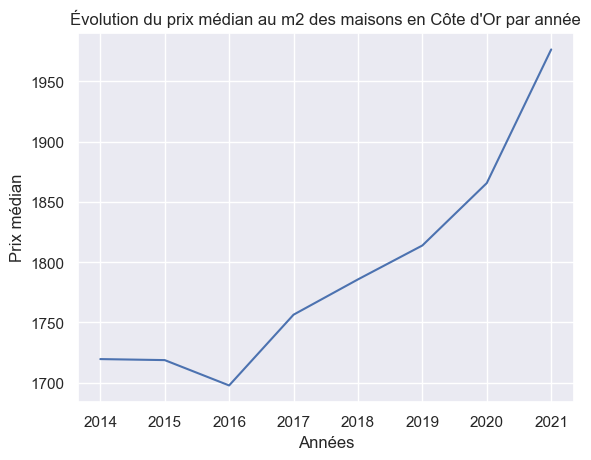

In [50]:
# Import du thème
sns.set_theme(style="darkgrid")

# Créer le barplot avec seaborn
sns.lineplot(x='Année de mutation', y='Maison', data=prix_m2_immo_an)

# Titres des axes et du graphique
plt.ylabel("Prix médian")
plt.xlabel("Années")
plt.title("Évolution du prix médian au m2 des maisons en Côte d'Or par année")
  
# Afficher le graphique
plt.show()

- Évolution du prix médian au m² des appartements

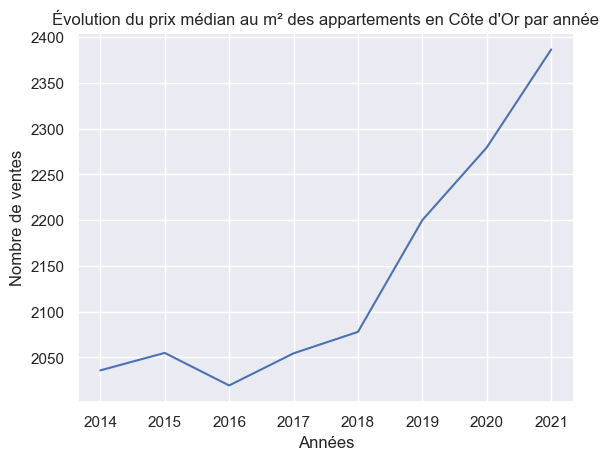

In [51]:
# Import du thème
sns.set_theme(style="darkgrid")

# Créer le barplot avec seaborn
sns.lineplot(x='Année de mutation', y='Appartement', data=prix_m2_immo_an)

# Titres des axes et du graphique
plt.ylabel("Nombre de ventes")
plt.xlabel("Années")
plt.title("Évolution du prix médian au m² des appartements en Côte d'Or par année")
  
# Afficher le graphique
plt.show()

**Comparaison entre EPCI**

In [52]:
# Sélectionner les lignes de la derniere annee
ventes_immo_derniere_annee = ventes_immo_geo[ventes_immo_geo['anneemut'] == derniere_annee]

# Création d'un dataframe avec le prix médian au m² des biens par année et par type de biens vendus
prix_immo_EPCI = ventes_immo_derniere_annee.pivot_table(index='IM',columns='codtypbien',values='valeurfonc',aggfunc='median')
prix_immo_EPCI = prix_immo_EPCI.reset_index()

# Nouveaux noms de colonne
nouveaux_noms = ['EPCI','Maison','Appartement']
prix_immo_EPCI.columns = nouveaux_noms


prix_immo_EPCI

,EPCI,Maison,Appartement
0,"CA Beaune, Côte et Sud - Communauté Beaune-Cha...",215000.00,125000.0
1,CC Auxonne Pontailler Val de Saône,164000.00,67000.0
2,"CC Forêts, Seine et Suzon",217500.00,230500.0
3,CC Mirebellois et Fontenois,174000.00,91000.0
4,CC Norge et Tille,320000.00,130000.0
5,CC Ouche et Montagne,212970.00,133775.0
6,CC Rives de Saône,155000.00,65000.0
7,CC Tille et Venelle,130000.00,93225.0
8,CC de Gevrey-Chambertin et de Nuits-Saint-Georges,229965.00,120000.0
9,CC de Pouilly-en-Auxois/Bligny-sur-Ouche,122000.00,81500.0


- Comparaison du prix médian des maisons entre les différents EPCI de Côte d'Or

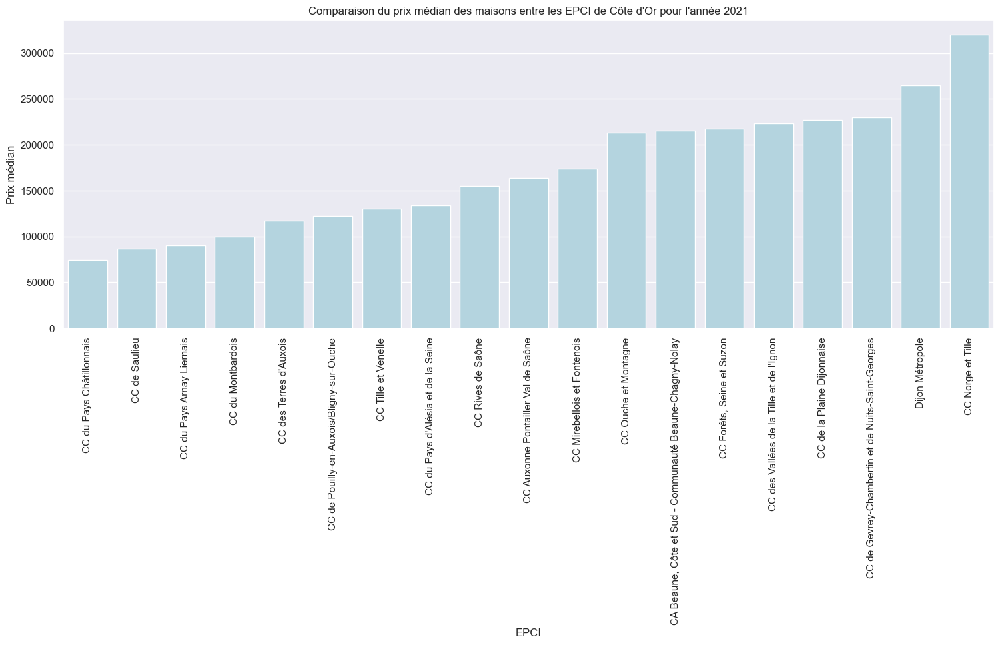

In [53]:
# Trier les barres par prix croissant
prix_immo_EPCI = prix_immo_EPCI.sort_values(by='Maison', ascending=True)

# Augmenter la taille du graphique
plt.figure(figsize=(18, 6))

# Créer le barplot avec seaborn
sns.barplot(x='EPCI', y='Maison', data=prix_immo_EPCI, color = 'lightblue')

# Afficher les étiquettes de l'axe x (villes)
plt.xticks(rotation=90)

# Titres des axes et du graphique
plt.ylabel("Prix médian")
plt.xlabel("EPCI")
plt.title(f"Comparaison du prix médian des maisons entre les EPCI de Côte d'Or pour l'année {derniere_annee}")

# Afficher le graphique
plt.show()

- Comparaison du prix médian des appartements entre les différents EPCI de Côte d'Or

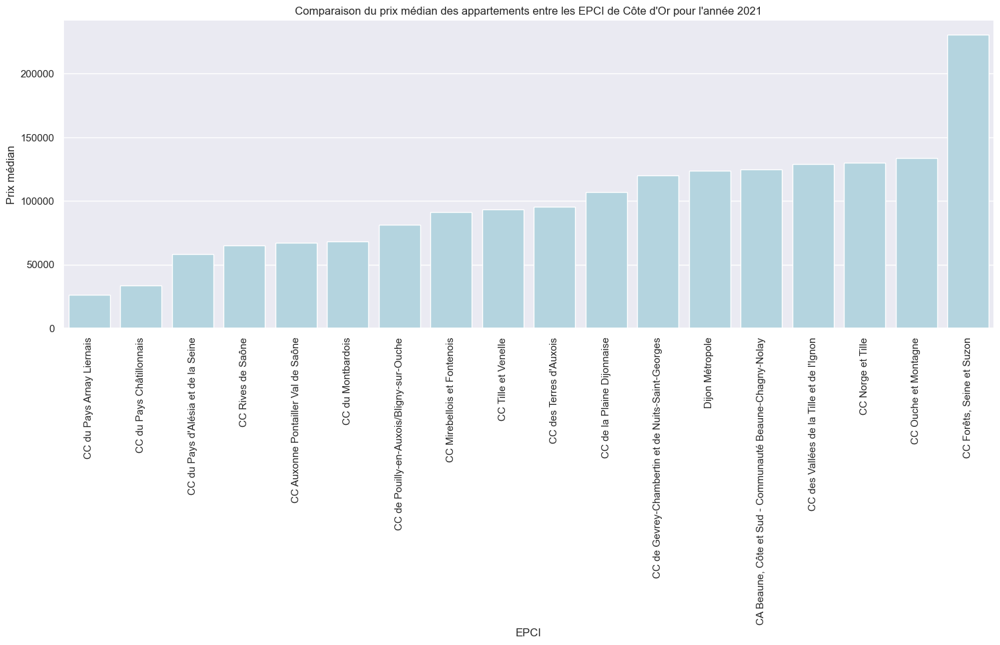

In [54]:
# Trier les barres par prix croissant
prix_immo_EPCI = prix_immo_EPCI.sort_values(by='Appartement', ascending=True)

# Augmenter la taille du graphique
plt.figure(figsize=(18, 6))

# Créer le barplot avec seaborn
sns.barplot(x='EPCI', y='Appartement', data=prix_immo_EPCI[prix_immo_EPCI["Appartement"].notna()], color = 'lightblue')

# Afficher les étiquettes de l'axe x (villes)
plt.xticks(rotation=90)

# Titres des axes et du graphique
plt.ylabel("Prix médian")
plt.xlabel("EPCI")
plt.title(f"Comparaison du prix médian des appartements entre les EPCI de Côte d'Or pour l'année {derniere_annee}")

# Afficher le graphique
plt.show()

In [55]:
# Sélectionner les lignes de la derniere annee
ventes_immo_derniere_annee = ventes_immo_geo[ventes_immo_geo['anneemut'] == 2021]

# Création d'un dataframe avec le prix médian au m² des biens par année et par type de biens vendus
prix_m2_immo_EPCI = ventes_immo_derniere_annee.pivot_table(index='IM',columns='codtypbien',values='prix_m2',aggfunc='median')
prix_m2_immo_EPCI = prix_m2_immo_EPCI.reset_index()

# Nouveaux noms de colonne
nouveaux_noms = ['EPCI','Maison','Appartement']
prix_m2_immo_EPCI.columns = nouveaux_noms


prix_m2_immo_EPCI

,EPCI,Maison,Appartement
0,"CA Beaune, Côte et Sud - Communauté Beaune-Cha...",2074.250000,2193.625337
1,CC Auxonne Pontailler Val de Saône,1635.201346,958.904110
2,"CC Forêts, Seine et Suzon",2063.135163,2051.154012
3,CC Mirebellois et Fontenois,1766.307471,1353.333333
4,CC Norge et Tille,2619.047619,1968.115942
5,CC Ouche et Montagne,1961.111111,1521.022727
6,CC Rives de Saône,1527.617431,952.380952
7,CC Tille et Venelle,1229.629630,1614.422789
8,CC de Gevrey-Chambertin et de Nuits-Saint-Georges,2121.349558,1919.354839
9,CC de Pouilly-en-Auxois/Bligny-sur-Ouche,1276.595745,1207.685063


- Comparaison du prix médian au m² des maisons entre les différents EPCI de Côte d'Or

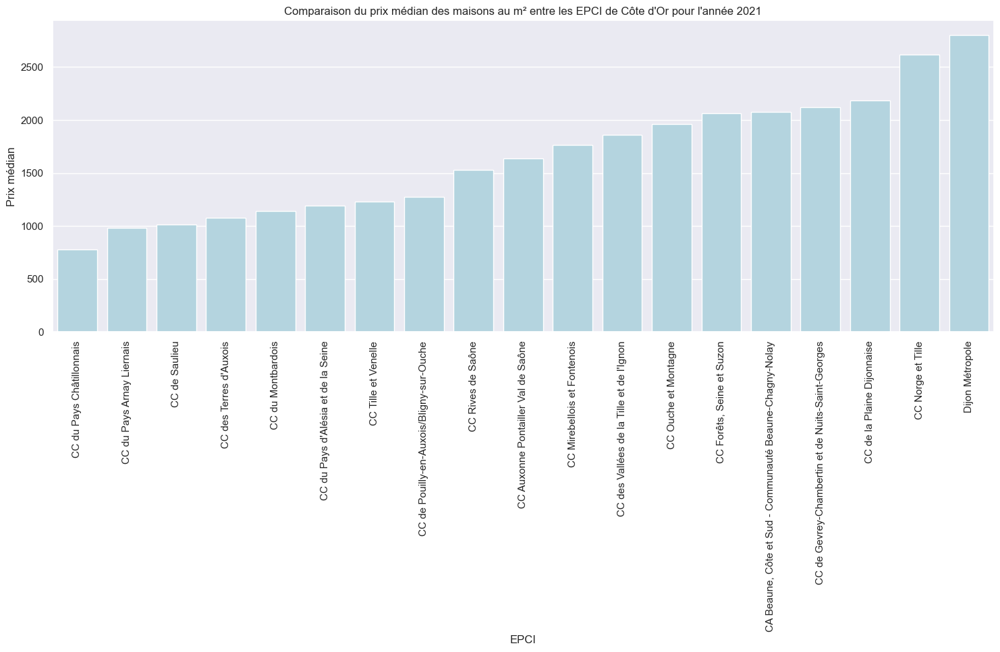

In [56]:
# Trier les barres par prix croissant
prix_m2_immo_EPCI = prix_m2_immo_EPCI.sort_values(by='Maison', ascending=True)

# Augmenter la taille du graphique
plt.figure(figsize=(18, 6))

# Créer le barplot avec seaborn
sns.barplot(x='EPCI', y='Maison', data=prix_m2_immo_EPCI, color = 'lightblue')

# Afficher les étiquettes de l'axe x (villes)
plt.xticks(rotation=90)

# Titres des axes et du graphique
plt.ylabel("Prix médian")
plt.xlabel("EPCI")
plt.title(f"Comparaison du prix médian des maisons au m² entre les EPCI de Côte d'Or pour l'année {derniere_annee}")

# Afficher le graphique
plt.show()

- Comparaison du prix médian au m² des appartements entre les différents EPCI de Côte d'Or

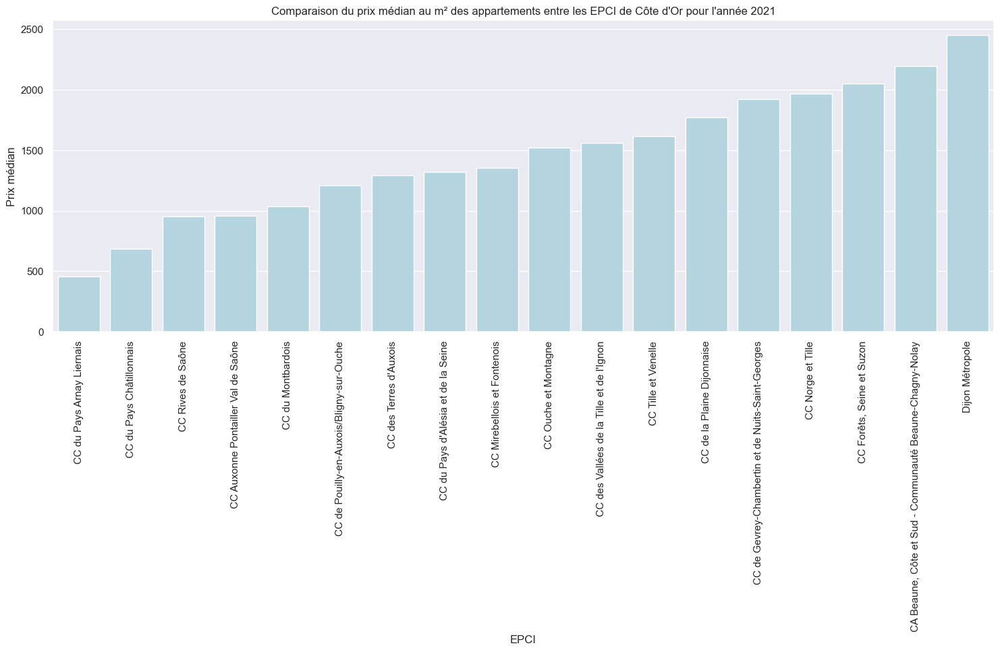

In [57]:
# Trier les barres par prix croissant
prix_m2_immo_EPCI = prix_m2_immo_EPCI.sort_values(by='Appartement', ascending=True)

# Augmenter la taille du graphique
plt.figure(figsize=(18, 6))

# Créer le barplot avec seaborn
sns.barplot(x='EPCI', y='Appartement', data=prix_m2_immo_EPCI[prix_m2_immo_EPCI["Appartement"].notna()], color = 'lightblue')

# Afficher les étiquettes de l'axe x (villes)
plt.xticks(rotation=90)

# Titres des axes et du graphique
plt.ylabel("Prix médian")
plt.xlabel("EPCI")
plt.title(f"Comparaison du prix médian au m² des appartements entre les EPCI de Côte d'Or pour l'année {derniere_annee}")

# Afficher le graphique
plt.show()

**Prix au m² selon la typologie des biens**

- Prix médian des maisons selon la typologie des biens

In [58]:
# Définition des variables
X = "nbp"
Y = "valeurfonc"

# Créer un dataframe concernant uniquement les ventes de maison pour la dernière année
ventes_maison = ventes_immo_geo.loc[(ventes_immo_geo['codtypbien']==111) & (ventes_immo_geo['anneemut']==derniere_annee),:]

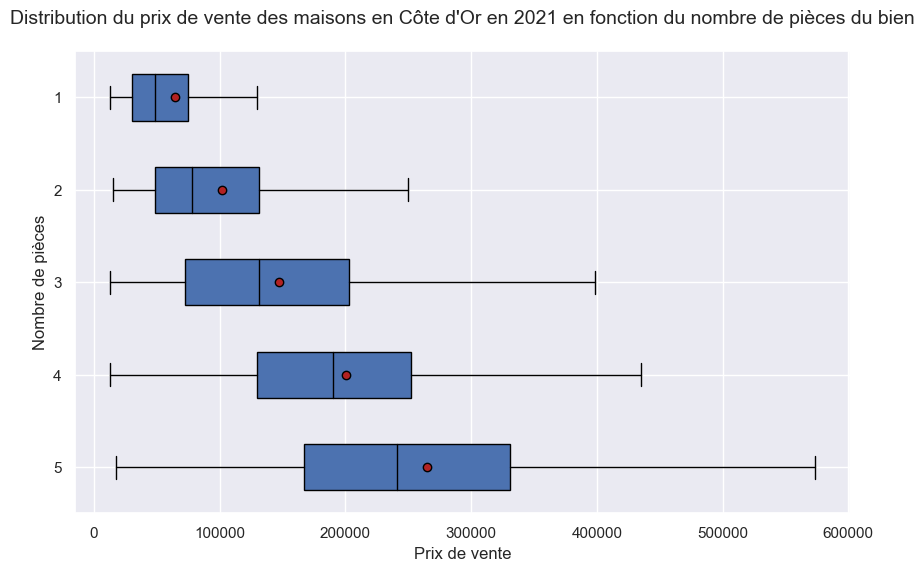

In [59]:
# Calcul de la distribution de l'âge pour chacune des trois catégories de livre
modalites = [5,4,3,2,1] 
groupes = [] 
for m in modalites: 
    groupes.append(ventes_maison[ventes_maison[X]==m][Y]) 

# Propriétés graphiques du graphique
medianprops = {'color':"black"} 
meanprops = {'marker':'o', 'markeredgecolor':'black', 
'markerfacecolor':'firebrick'} 

# Affichage du graphique
plt.figure(figsize=(10,6))
plt.boxplot(groupes, labels=modalites, showfliers=False, medianprops=medianprops, 
vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
plt.ylabel("Nombre de pièces") 
plt.xlabel('Prix de vente')
plt.title(f"Distribution du prix de vente des maisons en Côte d'Or en {derniere_annee} en fonction du nombre de pièces du bien",  fontsize=14, pad =20)
plt.show()

- Prix médian des appartements selon la typologie des biens

In [60]:
# Définition des variables
X = "nbp"
Y = "valeurfonc"

# Créer un dataframe concernant uniquement les ventes de maison pour la dernière année
ventes_appartement = ventes_immo_geo.loc[(ventes_immo_geo['codtypbien']==121) & (ventes_immo_geo['anneemut']==derniere_annee),:]

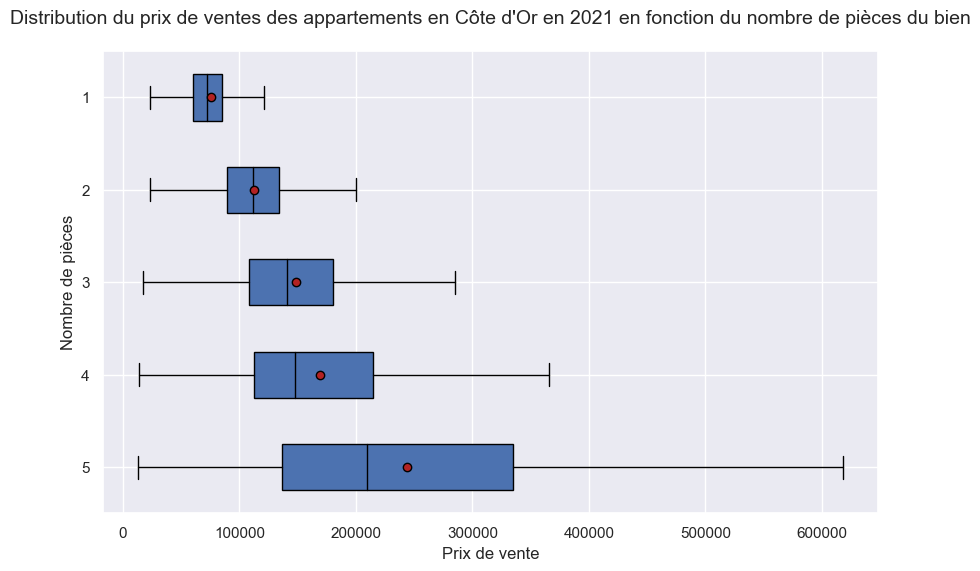

In [61]:
# Calcul de la distribution de l'âge pour chacune des trois catégories de livre
modalites = [5,4,3,2,1] 
groupes = [] 
for m in modalites: 
    groupes.append(ventes_appartement[ventes_appartement[X]==m][Y]) 

# Propriétés graphiques du graphique
medianprops = {'color':"black"} 
meanprops = {'marker':'o', 'markeredgecolor':'black', 
'markerfacecolor':'firebrick'} 

# Affichage du graphique
plt.figure(figsize=(10,6))
plt.boxplot(groupes, labels=modalites, showfliers=False, medianprops=medianprops, 
vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
plt.ylabel("Nombre de pièces") 
plt.xlabel('Prix de vente')
plt.title(f"Distribution du prix de ventes des appartements en Côte d'Or en {derniere_annee} en fonction du nombre de pièces du bien",  fontsize=14, pad =20)
plt.show()

- Prix médian au m² des maisons selon la typologie des biens

In [62]:
# Définition des variables
X = "nbp"
Y = "prix_m2"

# Créer un dataframe concernant uniquement les ventes de maison pour la dernière année
ventes_maison_m2 = ventes_immo_geo.loc[(ventes_immo_geo['codtypbien']==111) & (ventes_immo_geo['anneemut']==derniere_annee),:]

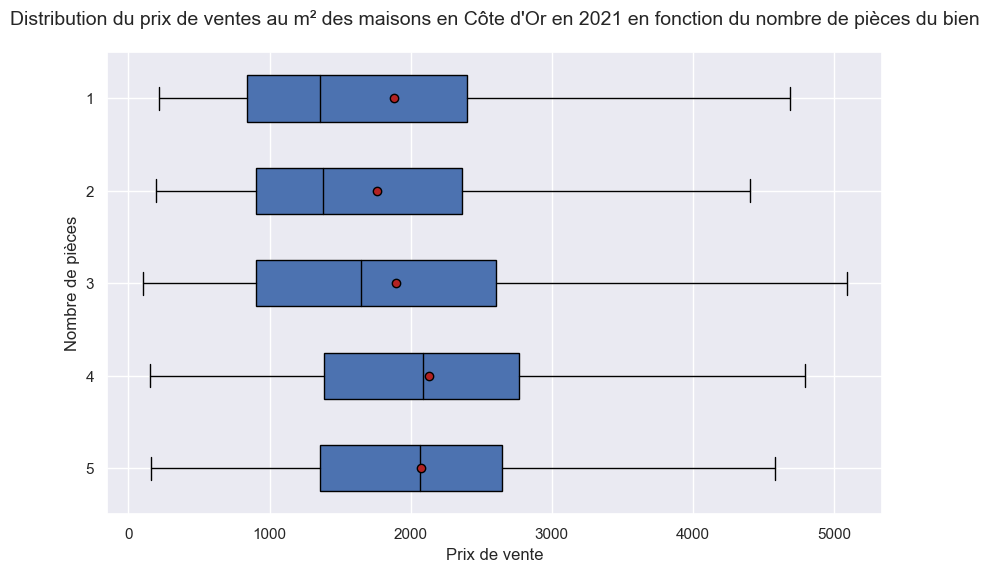

In [63]:
# Calcul de la distribution de l'âge pour chacune des trois catégories de livre
modalites = [5,4,3,2,1] 
groupes = [] 
for m in modalites: 
    groupes.append(ventes_maison_m2[ventes_maison_m2[X]==m][Y]) 

# Propriétés graphiques du graphique
medianprops = {'color':"black"} 
meanprops = {'marker':'o', 'markeredgecolor':'black', 
'markerfacecolor':'firebrick'} 

# Affichage du graphique
plt.figure(figsize=(10,6))
plt.boxplot(groupes, labels=modalites, showfliers=False, medianprops=medianprops, 
vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
plt.ylabel("Nombre de pièces") 
plt.xlabel('Prix de vente')
plt.title(f"Distribution du prix de ventes au m² des maisons en Côte d'Or en {derniere_annee} en fonction du nombre de pièces du bien",  fontsize=14, pad =20)
plt.show()

- Prix médian des appartements selon la typologie des biens

In [64]:
# Définition des variables
X = "nbp"
Y = "prix_m2"

# Créer un dataframe concernant uniquement les ventes de maison pour la dernière année
ventes_appartement_m2 = ventes_immo_geo.loc[(ventes_immo_geo['codtypbien']==121) & (ventes_immo_geo['anneemut']==derniere_annee),:]

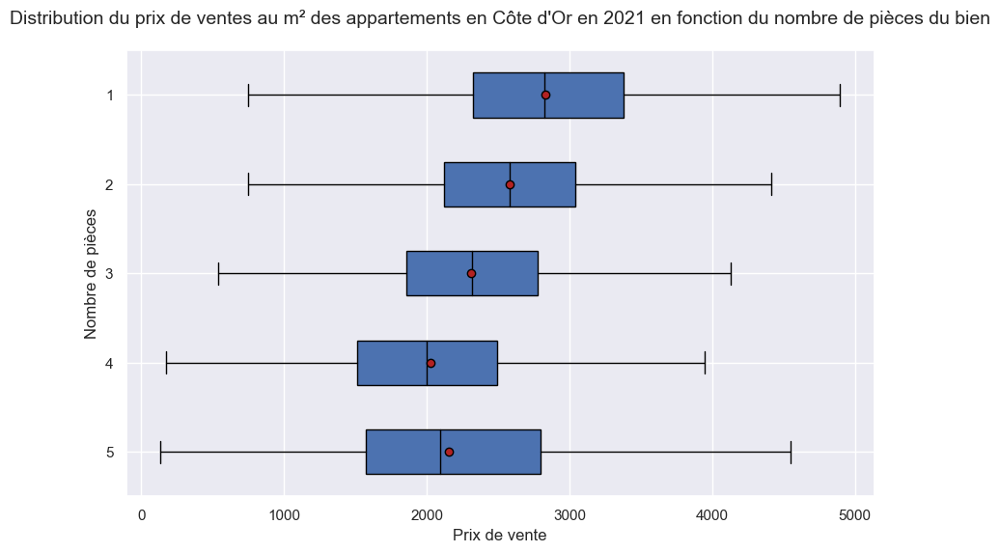

In [65]:
# Calcul de la distribution de l'âge pour chacune des trois catégories de livre
modalites = [5,4,3,2,1] 
groupes = [] 
for m in modalites: 
    groupes.append(ventes_appartement_m2[ventes_appartement_m2[X]==m][Y]) 

# Propriétés graphiques du graphique
medianprops = {'color':"black"} 
meanprops = {'marker':'o', 'markeredgecolor':'black', 
'markerfacecolor':'firebrick'} 

# Affichage du graphique
plt.figure(figsize=(10,6))
plt.boxplot(groupes, labels=modalites, showfliers=False, medianprops=medianprops, 
vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
plt.ylabel("Nombre de pièces") 
plt.xlabel('Prix de vente')
plt.title(f"Distribution du prix de ventes au m² des appartements en Côte d'Or en {derniere_annee} en fonction du nombre de pièces du bien",  fontsize=14, pad =20)
plt.show()

**Cartographies**

- Jointures pour intégrer les dimensions géographiques

In [66]:
# Créer un dataframe du prix médian par EPCI pour la dernière année
maison_m2_median_EPCI = ventes_maison.groupby(ventes_maison['EPCI'])['prix_m2'].median().reset_index(name='prix_median')

# Jointure entre les dimensions géométriques et le dataframe
maison_m2_median_EPCI_final = pd.merge(epci,maison_m2_median_EPCI, left_on='communes e', right_on='EPCI',how='left')

In [67]:
# Créer un dataframe du prix médian par EPCI pour la dernière année
appartement_m2_median_EPCI = ventes_appartement.groupby(ventes_appartement['EPCI'])['prix_m2'].median().reset_index(name='prix_median')

# Jointure entre les dimensions géométriques et le dataframe
appartement_m2_median_EPCI_final = pd.merge(epci,appartement_m2_median_EPCI, left_on='communes e', right_on='EPCI',how='left')

- Carte du prix au m² médian des maisons par EPCI

In [68]:
maison_m2_median_EPCI_final["prix_median"]=round(maison_m2_median_EPCI_final["prix_median"],2)

# Caractéristiques de la carte
m3 = maison_m2_median_EPCI_final.explore(
    column="prix_median",
    tooltip=["prix_median"],
    scheme="FisherJenks",
    legend_kwds=dict(colorbar=False),
    cmap="YlOrRd",
    style_kwds=dict(color="black")
    )

# Options des couches
folium.TileLayer('Stamen Toner', control=True).add_to(m3)
folium.LayerControl().add_to(m3)

# Affichage de la carte
m3

- Carte du prix au m² médian des appartements par EPCI

In [69]:
appartement_m2_median_EPCI_final["prix_median"]=round(appartement_m2_median_EPCI_final["prix_median"],2)

# Caractéristiques de la carte
m4 = appartement_m2_median_EPCI_final.explore(
    column="prix_median",
    tooltip=["prix_median"],
    scheme="FisherJenks",
    legend_kwds=dict(colorbar=False),
    cmap="YlOrRd",
    style_kwds=dict(color="black")
    )

# Options des couches
folium.TileLayer('Stamen Toner', control=True).add_to(m4)
folium.LayerControl().add_to(m4)

# Affichage de la carte
m4